# **Loading the data**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras.utils import img_to_array

In [ ]:
import os

In [ ]:
path = '/content/Dataset_BUSI_with_GT/'

Helper function to get the index for real image and mask.

In [ ]:
def num (image) :

    val = 0

    for i in range(len(image)) :
        if image[i] == '(' :
            while True :
                i += 1
                if image[i] == ')' :
                    break
                val = (val*10) + int(image[i])
            break

    return val

Initialize the arrays for benign, normal and malignant tumors, both real and mask. As already given the number of samples in benign, normal & malignant are 437, 133 and 210 respectively.

In [ ]:
img_b, mask_b = np.zeros((437, 128, 128, 1)), np.zeros((437, 128, 128, 1))
img_n, mask_n = np.zeros((133, 128, 128, 1)), np.zeros((133, 128, 128, 1))
img_m, mask_m = np.zeros((210, 128, 128, 1)), np.zeros((210, 128, 128, 1))

In [ ]:
for i, tumor_type in enumerate(os.listdir(path)) :
    for image in os.listdir(path+tumor_type+'/') :
        p = os.path.join(path+tumor_type, image)
        img = cv2.imread(p,cv2.IMREAD_GRAYSCALE)           # read image as  grayscale

        if image[-5] == ')' :

            img = cv2.resize(img,(128,128))
            pil_img = Image.fromarray (img)

            if image[0] == 'b' :
                img_b[num(image)-1]+= img_to_array(pil_img)  # If image is real add it
            if image[0] == 'n' :                           # to X as benign , normal
                img_n[num(image)-1]+= img_to_array(pil_img)  # or malignant.
            if image[0] == 'm' :
                img_m[num(image)-1]+= img_to_array(pil_img)
        else :
            img = cv2.resize(img,(128,128))
            pil_img = Image.fromarray (img)

            if image[0] == 'b' :
                mask_b[num(image)-1]+= img_to_array(pil_img)  # Similarly add the target
            if image[0] == 'n' :                           # mask to y.
                mask_n[num(image)-1]+= img_to_array(pil_img)
            if image[0] == 'm' :
                mask_m[num(image)-1]+= img_to_array(pil_img)


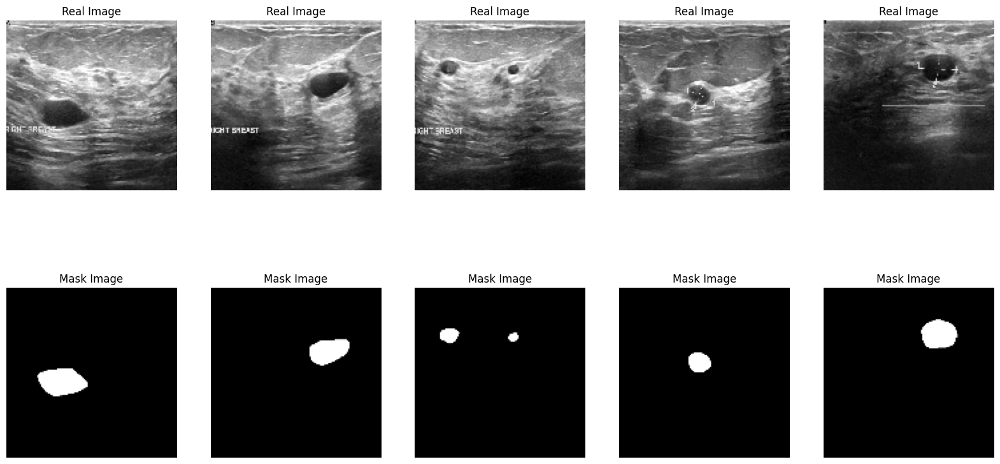

In [ ]:
plt.figure(figsize = (20,10))

for i in range(5) :
    plt.subplot(2,5,i+1)
    plt.imshow(img_b[i+1], 'gray')
    plt.title('Real Image')
    plt.axis('off')

for i in range(5) :
    plt.subplot(2,5,i+6)
    plt.imshow(mask_b[i+1], 'gray')
    plt.title('Mask Image')
    plt.axis('off')
plt.show()

**Creating datasets for model training and validation**

In [ ]:
scan = np.concatenate((img_b, img_n, img_m), axis = 0)
mask = np.concatenate((mask_b, mask_n, mask_m), axis = 0)

**Data Preprocessing**

In [ ]:
scan /= 255.0
mask /= 255.0

In [ ]:
print(scan.shape)
print(mask.shape)

(780, 128, 128, 1)
(780, 128, 128, 1)


In [ ]:
print(scan.max())
print(scan.min())

1.0
0.0


In [ ]:
print(mask.max())
print(mask.min())

2.0
0.0


In [ ]:
scan[scan > 1.0] = 1.0
mask[mask > 1.0] = 1.0

In [ ]:
print(scan.max())
print(scan.min())
print(mask.max())
print(mask.min())

1.0
0.0
1.0
0.0


### **Visualization**

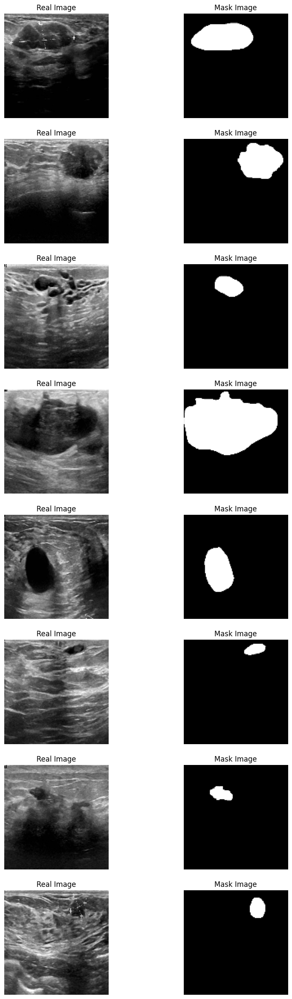

In [ ]:
plt.figure(figsize = (10,30))
i = 0
while i < 16 :

    x = np.random.randint(0,780)

    plt.subplot(8,2,i+1)
    plt.imshow(scan[x],'gray')
    plt.title('Real Image')
    plt.axis('off')

    plt.subplot(8,2,i+2)
    plt.imshow(mask[x],'gray')
    plt.title('Mask Image')
    plt.axis('off')

    i += 2
plt.show()

## **Train test split**

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
scan_train, scan_test, mask_train, mask_test = train_test_split(scan, mask, test_size = 0.05, random_state = 1)

In [ ]:
print(scan_train.shape)
print(mask_train.shape)

(741, 128, 128, 1)
(741, 128, 128, 1)


In [ ]:
print(scan_test.shape)
print(mask_test.shape)

(39, 128, 128, 1)
(39, 128, 128, 1)


# **Image Segmentation**

## **U-net**

In [ ]:
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import Concatenate
from keras.layers import MaxPooling2D
from keras.layers import Conv2DTranspose

from keras import Model

Contracting path

In [ ]:
inply = Input((128, 128, 1,))

conv1 = Conv2D(2**6, (3,3), activation = 'relu', padding = 'same')(inply)
conv1 = Conv2D(2**6, (3,3), activation = 'relu', padding = 'same')(conv1)
pool1 = MaxPooling2D((2,2), strides = 2, padding = 'same')(conv1)
drop1 = Dropout(0.2)(pool1)

conv2 = Conv2D(2**7, (3,3), activation = 'relu', padding = 'same')(drop1)
conv2 = Conv2D(2**7, (3,3), activation = 'relu', padding = 'same')(conv2)
pool2 = MaxPooling2D((2,2), strides = 2, padding = 'same')(conv2)
drop2 = Dropout(0.2)(pool2)

conv3 = Conv2D(2**8, (3,3), activation = 'relu', padding = 'same')(drop2)
conv3 = Conv2D(2**8, (3,3), activation = 'relu', padding = 'same')(conv3)
pool3 = MaxPooling2D((2,2), strides = 2, padding = 'same')(conv3)
drop3 = Dropout(0.2)(pool3)

conv4 = Conv2D(2**9, (3,3), activation = 'relu', padding = 'same')(drop3)
conv4 = Conv2D(2**9, (3,3), activation = 'relu', padding = 'same')(conv4)
pool4 = MaxPooling2D((2,2), strides = 2, padding = 'same')(conv4)
drop4 = Dropout(0.2)(pool4)

Bottleneck layer

In [ ]:
convm = Conv2D(2**10, (3,3), activation = 'relu', padding = 'same')(drop4)
convm = Conv2D(2**10, (3,3), activation = 'relu', padding = 'same')(convm)

Expanding layer

In [ ]:
tran5 = Conv2DTranspose(2**9, (2,2), strides = 2, padding = 'valid', activation = 'relu')(convm)
conc5 = Concatenate()([tran5, conv4])
conv5 = Conv2D(2**9, (3,3), activation = 'relu', padding = 'same')(conc5)
conv5 = Conv2D(2**9, (3,3), activation = 'relu', padding = 'same')(conv5)
drop5 = Dropout(0.1)(conv5)

tran6 = Conv2DTranspose(2**8, (2,2), strides = 2, padding = 'valid', activation = 'relu')(drop5)
conc6 = Concatenate()([tran6, conv3])
conv6 = Conv2D(2**8, (3,3), activation = 'relu', padding = 'same')(conc6)
conv6 = Conv2D(2**8, (3,3), activation = 'relu', padding = 'same')(conv6)
drop6 = Dropout(0.1)(conv6)

tran7 = Conv2DTranspose(2**7, (2,2), strides = 2, padding = 'valid', activation = 'relu')(drop6)
conc7 = Concatenate()([tran7, conv2])
conv7 = Conv2D(2**7, (3,3), activation = 'relu', padding = 'same')(conc7)
conv7 = Conv2D(2**7, (3,3), activation = 'relu', padding = 'same')(conv7)
drop7 = Dropout(0.1)(conv7)

tran8 = Conv2DTranspose(2**6, (2,2), strides = 2, padding = 'valid', activation = 'relu')(drop7)
conc8 = Concatenate()([tran8, conv1])
conv8 = Conv2D(2**6, (3,3), activation = 'relu', padding = 'same')(conc8)
conv8 = Conv2D(2**6, (3,3), activation = 'relu', padding = 'same')(conv8)
drop8 = Dropout(0.1)(conv8)

In [ ]:
outly = Conv2D(2**0, (1,1), activation = 'relu', padding = 'same')(drop8)
model = Model(inputs = inply, outputs = outly, name = 'U-net')

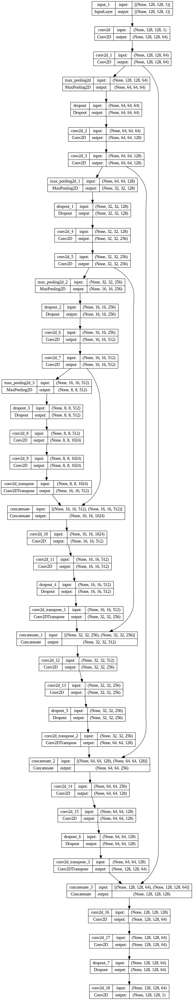

In [ ]:
keras.utils.plot_model(model, './model_plot.png', show_shapes = True)

Loss function

In [ ]:
from keras.losses import BinaryCrossentropy

Training

In [ ]:
model.compile(loss = BinaryCrossentropy(), optimizer = keras.optimizers.Adam(learning_rate = 0.00005))
print(model.summary())

Model: "U-net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 64  640         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 128, 128, 64  36928       ['conv2d[0][0]']                 
                                )                                                             

In [ ]:
from keras.callbacks import ModelCheckpoint


In [ ]:
checkp = ModelCheckpoint('./cancer_image_model_final.h5', monitor = 'val_loss', save_best_only = True, verbose = 1)


In [ ]:
history = model.fit(scan_train, mask_train, epochs = 100, batch_size = 32, validation_data = (scan_test, mask_test), callbacks = [checkp])

Epoch 1/100
24/24 [==============================] - ETA: 0s - loss: 0.4646
Epoch 1: val_loss improved from inf to 0.30725, saving model to ./cancer_image_model_final.h5
24/24 [==============================] - 47s 764ms/step - loss: 0.4646 - val_loss: 0.3072
Epoch 2/100
24/24 [==============================] - ETA: 0s - loss: 0.2992
Epoch 2: val_loss improved from 0.30725 to 0.28532, saving model to ./cancer_image_model_final.h5
24/24 [==============================] - 12s 485ms/step - loss: 0.2992 - val_loss: 0.2853
Epoch 3/100
24/24 [==============================] - ETA: 0s - loss: 0.2738
Epoch 3: val_loss improved from 0.28532 to 0.24992, saving model to ./cancer_image_model_final.h5
24/24 [==============================] - 12s 486ms/step - loss: 0.2738 - val_loss: 0.2499
Epoch 4/100
24/24 [==============================] - ETA: 0s - loss: 0.2664
Epoch 4: val_loss did not improve from 0.24992
24/24 [==============================] - 11s 441ms/step - loss: 0.2664 - val_loss: 0.2655

Model Performance

Text(0.5, 1.0, 'Losses vs Epochs')

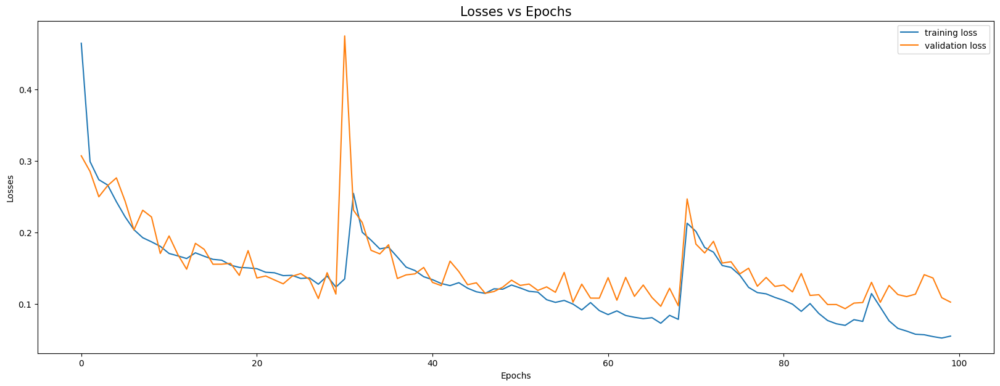

In [ ]:
plt.figure(figsize = (20,7))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training loss', 'validation loss'])
plt.xlabel('Epochs')
plt.ylabel('Losses')
plt.title('Losses vs Epochs', fontsize = 15)

In [ ]:
from keras.models import load_model
model = load_model('./cancer_image_model_final.h5')

In [ ]:
mask_pred = model.predict(scan_test)

2/2 [==============================] - 1s 149ms/step


In [ ]:
print(mask_pred.shape)

(39, 128, 128, 1)


Predictions

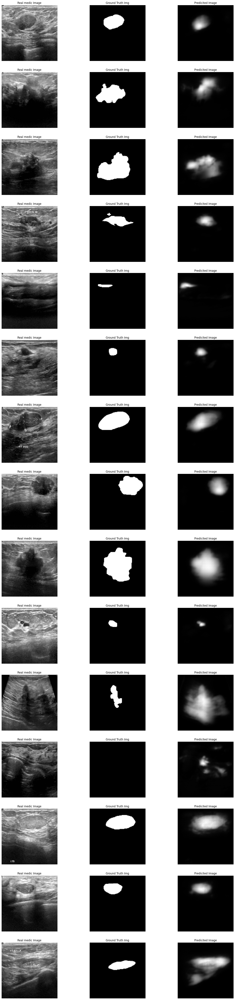

In [ ]:
plt.figure(figsize = (20,80))

i = 0
x = 0
while i < 45 :

    plt.subplot(15,3,i+1)
    plt.imshow(scan_test[x], 'gray')
    plt.title('Real medic Image')
    plt.axis('off')

    plt.subplot(15,3,i+2)
    plt.imshow(mask_test[x], 'gray')
    plt.title('Ground Truth Img')
    plt.axis('off')

    plt.subplot(15,3,i+3)
    plt.imshow(mask_pred[x], 'gray')
    plt.title('Predicited Image')
    plt.axis('off')

    x += 1
    i += 3
plt.show()

## **Attention UNet**

In [ ]:
!pip install tf_explain

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 1.1 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf

In [ ]:
from keras.models import Model
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import UpSampling2D
from keras.layers import concatenate
from keras.layers import Add
from keras.layers import Multiply
from keras.layers import Input
from keras.layers import MaxPool2D
from keras.layers import BatchNormalization

# Callbacks
from keras.callbacks import Callback
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from tf_explain.core.grad_cam import GradCAM

# Metrics
from keras.metrics import MeanIoU

ENCODER

In [ ]:
class EncoderBlock(Layer):

    def __init__(self, filters, rate, pooling=True, **kwargs):
        super(EncoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate
        self.pooling = pooling

        self.c1 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.drop = Dropout(rate)
        self.c2 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.pool = MaxPool2D()

    def call(self, X):
        x = self.c1(X)
        x = self.drop(x)
        x = self.c2(x)
        if self.pooling:
            y = self.pool(x)
            return y, x
        else:
            return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
            'pooling':self.pooling
        }

DECODER

In [ ]:
class DecoderBlock(Layer):

    def __init__(self, filters, rate, **kwargs):
        super(DecoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate

        self.up = UpSampling2D()
        self.net = EncoderBlock(filters, rate, pooling=False)

    def call(self, X):
        X, skip_X = X
        x = self.up(X)
        c_ = concatenate([x, skip_X])
        x = self.net(c_)
        return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
        }

ATTENTION GATE

In [ ]:
class AttentionGate(Layer):

    def __init__(self, filters, bn, **kwargs):
        super(AttentionGate, self).__init__(**kwargs)

        self.filters = filters
        self.bn = bn

        self.normal = Conv2D(filters, kernel_size=3, padding='same', activation='relu', kernel_initializer='he_normal')
        self.down = Conv2D(filters, kernel_size=3, strides=2, padding='same', activation='relu', kernel_initializer='he_normal')
        self.learn = Conv2D(1, kernel_size=1, padding='same', activation='sigmoid')
        self.resample = UpSampling2D()
        self.BN = BatchNormalization()

    def call(self, X):
        X, skip_X = X

        x = self.normal(X)
        skip = self.down(skip_X)
        x = Add()([x, skip])
        x = self.learn(x)
        x = self.resample(x)
        f = Multiply()([x, skip_X])
        if self.bn:
            return self.BN(f)
        else:
            return f
        # return f

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "bn":self.bn
        }

CALLBACKS

In [ ]:
def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')

In [ ]:
class ShowProgress(Callback):
    def on_epoch_end(self, epochs, logs=None):
        id = np.random.randint(200)
        exp = GradCAM()
        image = scan[id]
        m = mask[id]
        pred_mask = self.model.predict(image[np.newaxis,...])
        cam = exp.explain(
            validation_data=(image[np.newaxis,...], m),
            class_index=1,
            layer_name='Attention4',
            model=self.model
        )

        plt.figure(figsize=(10,5))

        plt.subplot(1,3,1)
        plt.title("Original Mask")
        show_mask(image, m, cmap='copper')

        plt.subplot(1,3,2)
        plt.title("Predicted Mask")
        show_mask(image, pred_mask, cmap='copper')

        plt.subplot(1,3,3)
        show_image(cam,title="GradCAM")

        plt.tight_layout()
        plt.show()

In [ ]:
# Inputs
input_layer = Input(shape=scan.shape[-3:])

# Encoder
p1, c1 = EncoderBlock(32,0.1, name="Encoder1")(input_layer)
p2, c2 = EncoderBlock(64,0.1, name="Encoder2")(p1)
p3, c3 = EncoderBlock(128,0.2, name="Encoder3")(p2)
p4, c4 = EncoderBlock(256,0.2, name="Encoder4")(p3)

# Encoding
encoding = EncoderBlock(512,0.3, pooling=False, name="Encoding")(p4)

# Attention + Decoder

a1 = AttentionGate(256, bn=True, name="Attention1")([encoding, c4])
d1 = DecoderBlock(256,0.2, name="Decoder1")([encoding, a1])

a2 = AttentionGate(128, bn=True, name="Attention2")([d1, c3])
d2 = DecoderBlock(128,0.2, name="Decoder2")([d1, a2])

a3 = AttentionGate(64, bn=True, name="Attention3")([d2, c2])
d3 = DecoderBlock(64,0.1, name="Decoder3")([d2, a3])


a4 = AttentionGate(32, bn=True, name="Attention4")([d3, c1])
d4 = DecoderBlock(32,0.1, name="Decoder4")([d3, a4])

# Output
output_layer = Conv2D(1, kernel_size=1, activation='sigmoid', padding='same')(d4)

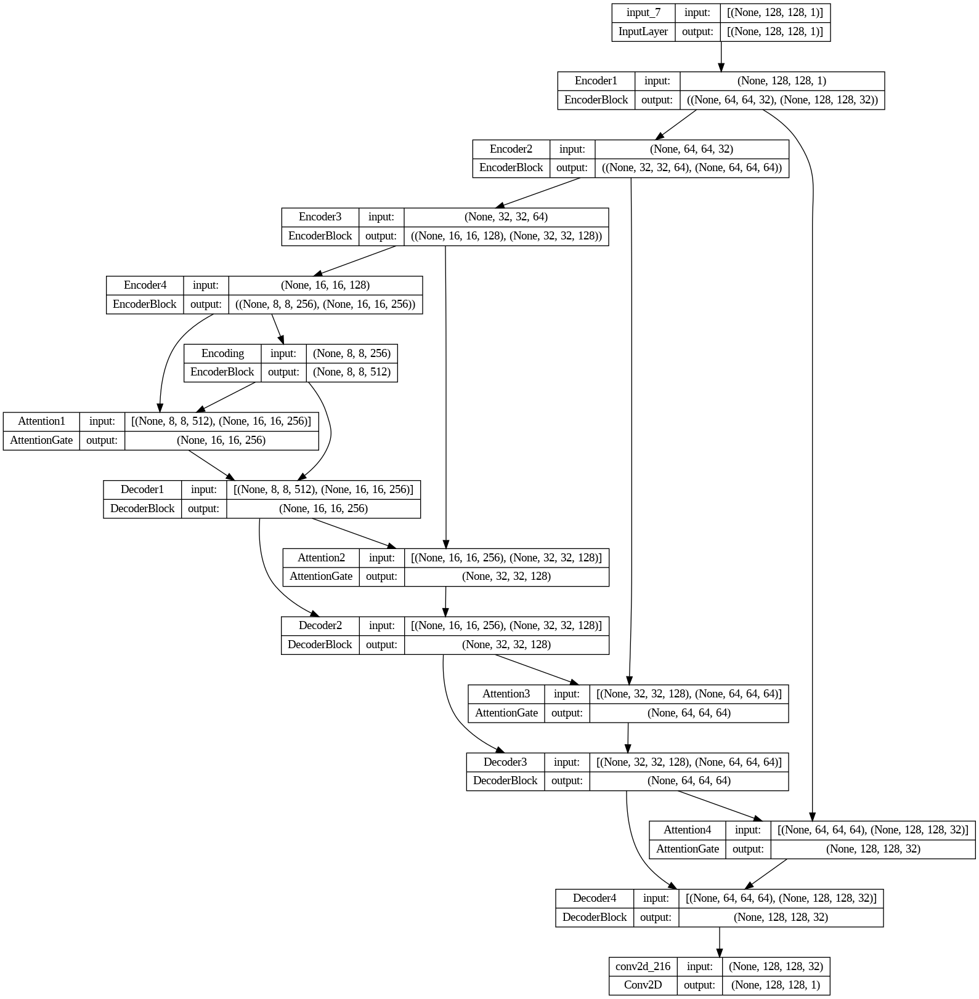

In [ ]:
keras.utils.plot_model(model, './attunet_plot.png', show_shapes = True)

In [ ]:
model = Model(
    inputs=[input_layer],
    outputs=[output_layer]
)

In [ ]:
model.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy', MeanIoU(num_classes=2, name='IoU')]
)

In [ ]:
# Callbacks
cb = [
    # EarlyStopping(patience=3, restore_best_weight=True),
    ModelCheckpoint("AttentionCustomUNet.h5", save_best_only=True),
    ShowProgress()
]

Training

Epoch 1/20
1/1 [==============================] - 0s 354ms/step


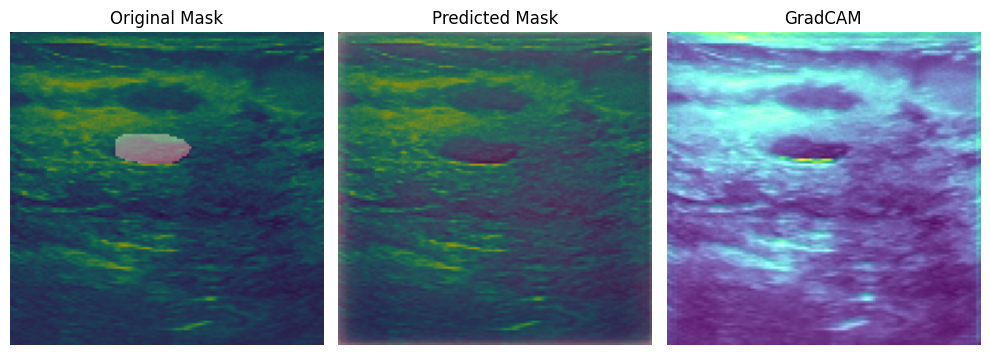

97/97 [==============================] - 22s 100ms/step - loss: 0.5738 - accuracy: 0.9121 - IoU: 0.4620 - val_loss: 0.2719 - val_accuracy: 0.9174 - val_IoU: 0.4599
Epoch 2/20
1/1 [==============================] - 0s 19ms/step


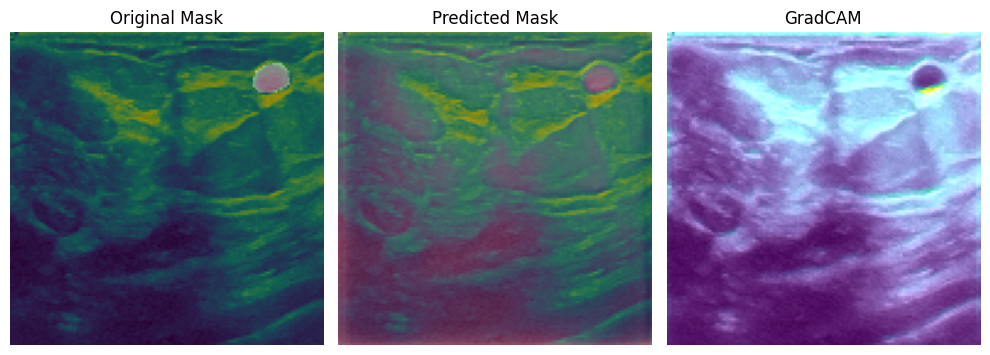

97/97 [==============================] - 9s 89ms/step - loss: 0.1933 - accuracy: 0.9325 - IoU: 0.4617 - val_loss: 0.2803 - val_accuracy: 0.9174 - val_IoU: 0.4599
Epoch 3/20
1/1 [==============================] - 0s 32ms/step


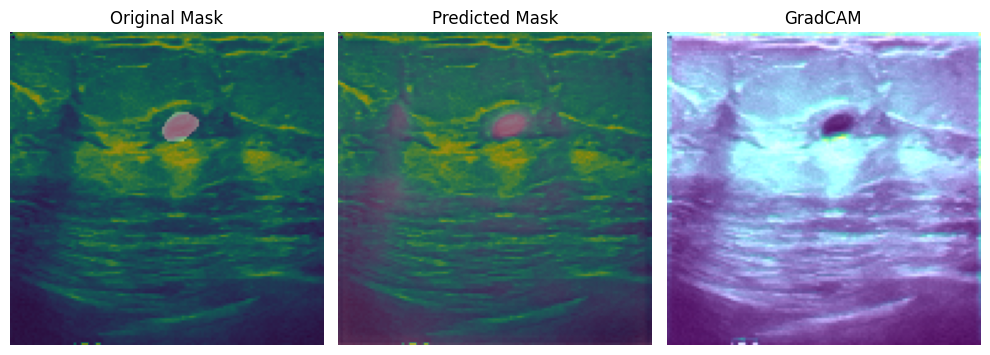

97/97 [==============================] - 9s 95ms/step - loss: 0.1793 - accuracy: 0.9365 - IoU: 0.4616 - val_loss: 0.2570 - val_accuracy: 0.9219 - val_IoU: 0.4599
Epoch 4/20
1/1 [==============================] - 0s 22ms/step


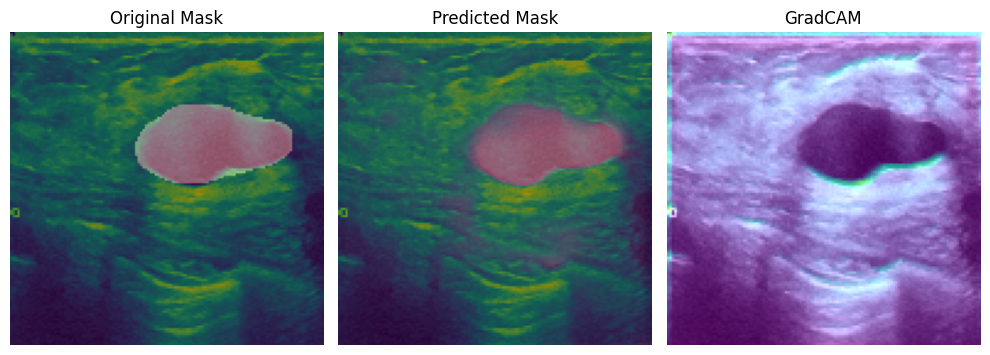

97/97 [==============================] - 9s 91ms/step - loss: 0.1714 - accuracy: 0.9374 - IoU: 0.4611 - val_loss: 0.1956 - val_accuracy: 0.9305 - val_IoU: 0.4599
Epoch 5/20
1/1 [==============================] - 0s 23ms/step


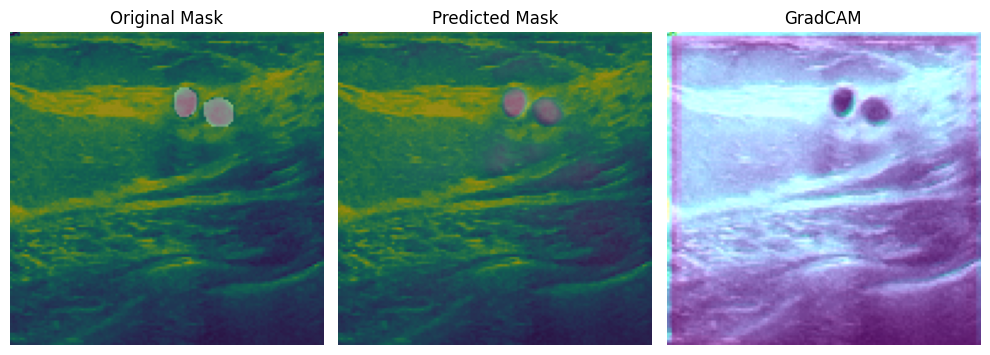

97/97 [==============================] - 9s 91ms/step - loss: 0.1709 - accuracy: 0.9385 - IoU: 0.4617 - val_loss: 0.1646 - val_accuracy: 0.9449 - val_IoU: 0.4599
Epoch 6/20
1/1 [==============================] - 0s 31ms/step


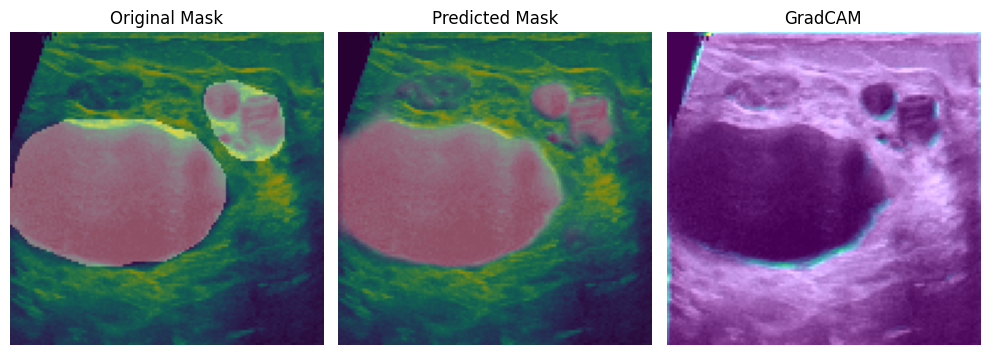

97/97 [==============================] - 9s 95ms/step - loss: 0.1627 - accuracy: 0.9422 - IoU: 0.4605 - val_loss: 0.1520 - val_accuracy: 0.9411 - val_IoU: 0.4599
Epoch 7/20
1/1 [==============================] - 0s 37ms/step


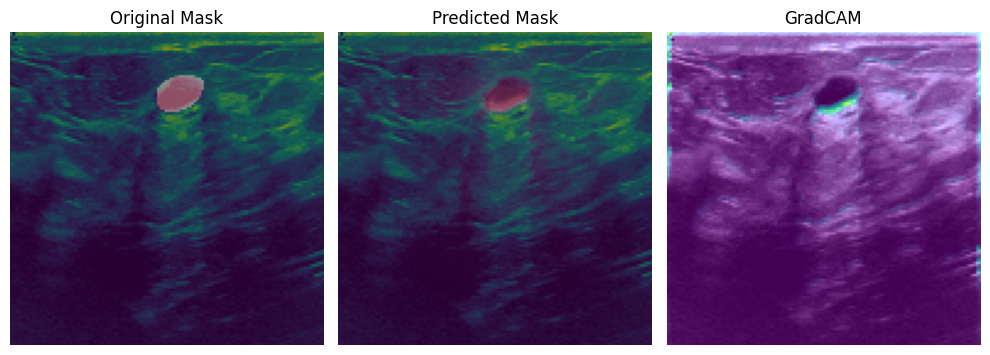

97/97 [==============================] - 9s 94ms/step - loss: 0.1529 - accuracy: 0.9447 - IoU: 0.4616 - val_loss: 0.1905 - val_accuracy: 0.9213 - val_IoU: 0.4599
Epoch 8/20
1/1 [==============================] - 0s 79ms/step


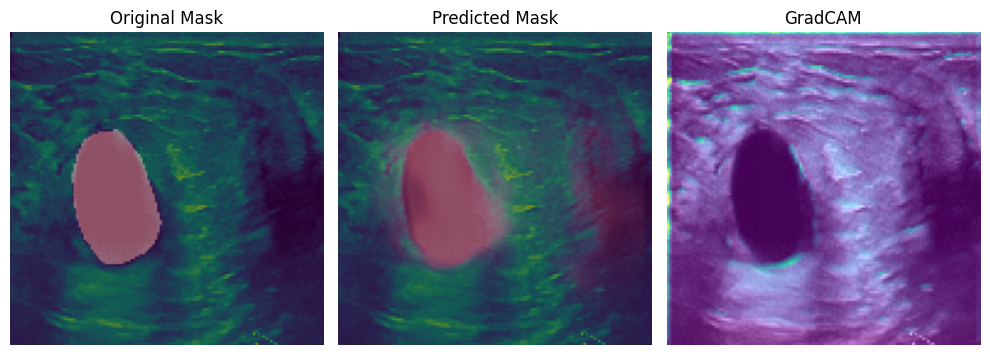

97/97 [==============================] - 11s 116ms/step - loss: 0.1391 - accuracy: 0.9506 - IoU: 0.4620 - val_loss: 0.1300 - val_accuracy: 0.9491 - val_IoU: 0.4599
Epoch 9/20
1/1 [==============================] - 0s 19ms/step


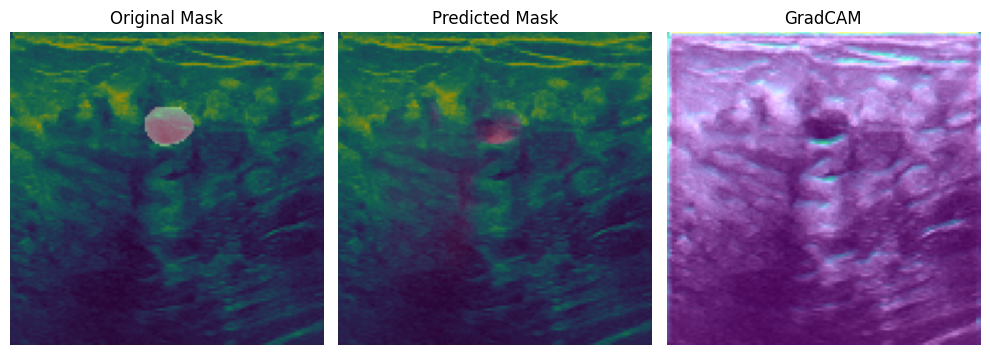

97/97 [==============================] - 9s 95ms/step - loss: 0.1394 - accuracy: 0.9508 - IoU: 0.4612 - val_loss: 0.2236 - val_accuracy: 0.9207 - val_IoU: 0.4599
Epoch 10/20
1/1 [==============================] - 0s 21ms/step


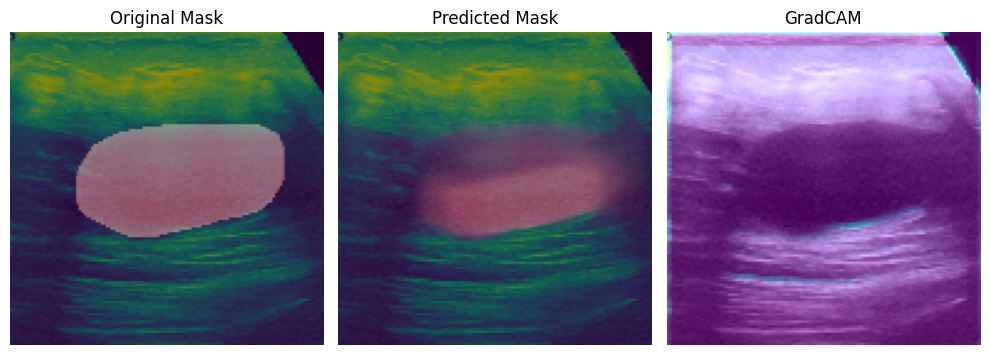

97/97 [==============================] - 9s 91ms/step - loss: 0.1355 - accuracy: 0.9508 - IoU: 0.4634 - val_loss: 0.1660 - val_accuracy: 0.9275 - val_IoU: 0.4599
Epoch 11/20
1/1 [==============================] - 0s 57ms/step


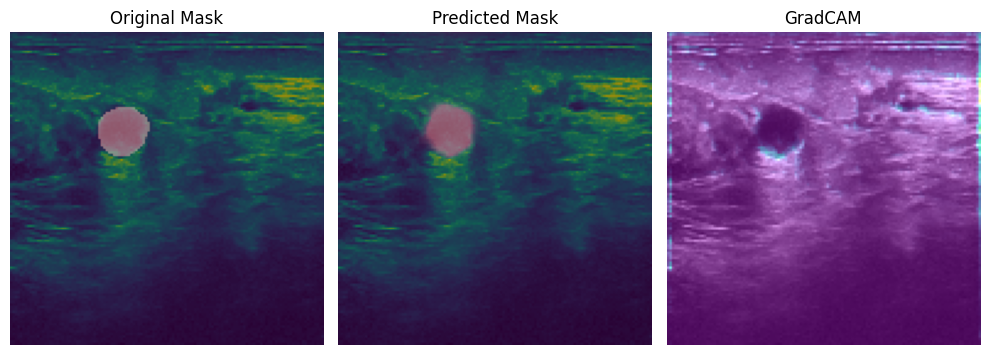

97/97 [==============================] - 9s 90ms/step - loss: 0.1207 - accuracy: 0.9571 - IoU: 0.4607 - val_loss: 0.1893 - val_accuracy: 0.9283 - val_IoU: 0.4599
Epoch 12/20
1/1 [==============================] - 0s 24ms/step


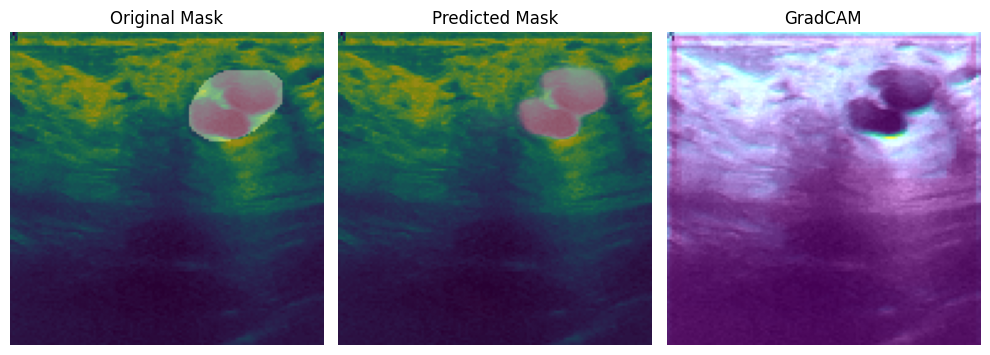

97/97 [==============================] - 9s 91ms/step - loss: 0.1362 - accuracy: 0.9513 - IoU: 0.4636 - val_loss: 0.1286 - val_accuracy: 0.9491 - val_IoU: 0.4599
Epoch 13/20
1/1 [==============================] - 0s 49ms/step


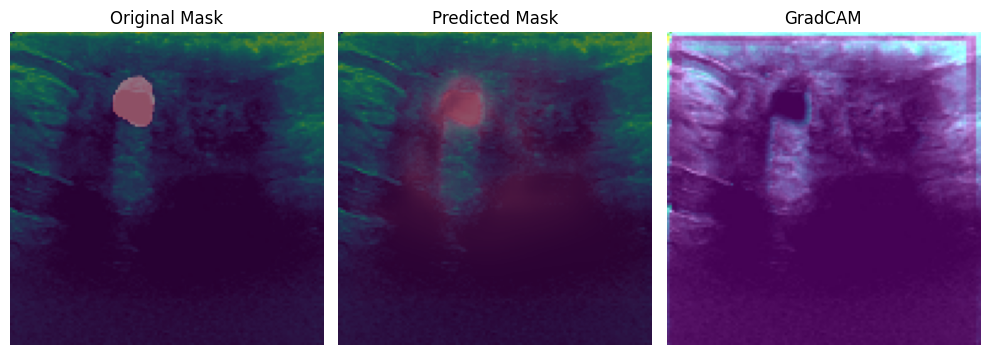

97/97 [==============================] - 9s 90ms/step - loss: 0.1283 - accuracy: 0.9533 - IoU: 0.4618 - val_loss: 0.1363 - val_accuracy: 0.9454 - val_IoU: 0.4599
Epoch 14/20
1/1 [==============================] - 0s 32ms/step


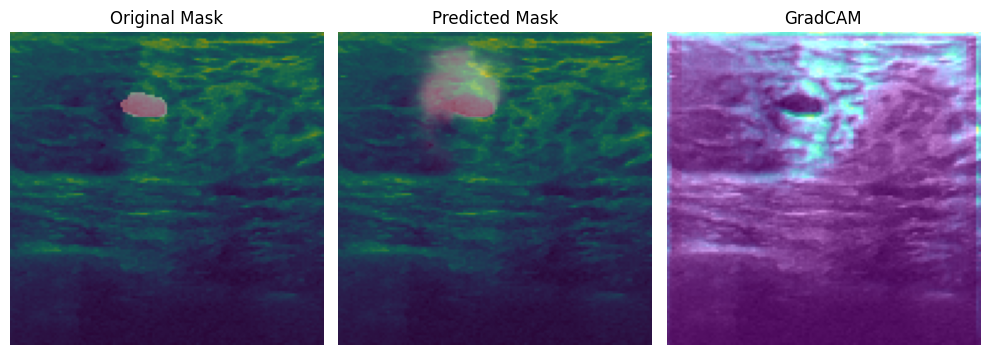

97/97 [==============================] - 9s 92ms/step - loss: 0.1156 - accuracy: 0.9584 - IoU: 0.4628 - val_loss: 0.1155 - val_accuracy: 0.9570 - val_IoU: 0.4599
Epoch 15/20
1/1 [==============================] - 0s 31ms/step


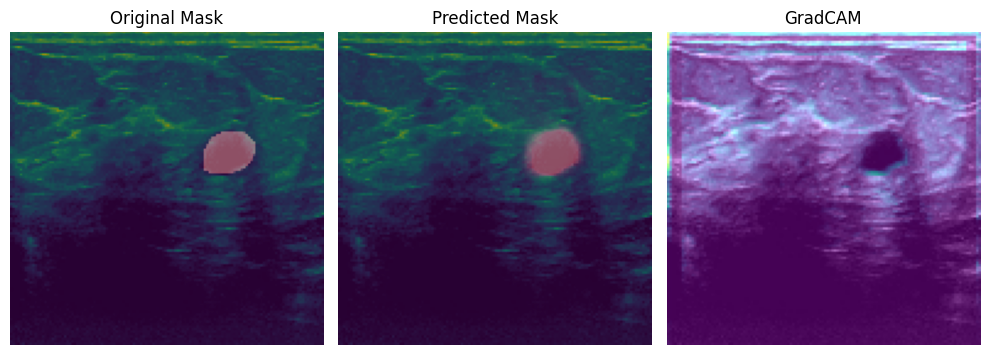

97/97 [==============================] - 9s 89ms/step - loss: 0.1250 - accuracy: 0.9556 - IoU: 0.4617 - val_loss: 0.1242 - val_accuracy: 0.9511 - val_IoU: 0.4599
Epoch 16/20
1/1 [==============================] - 0s 45ms/step


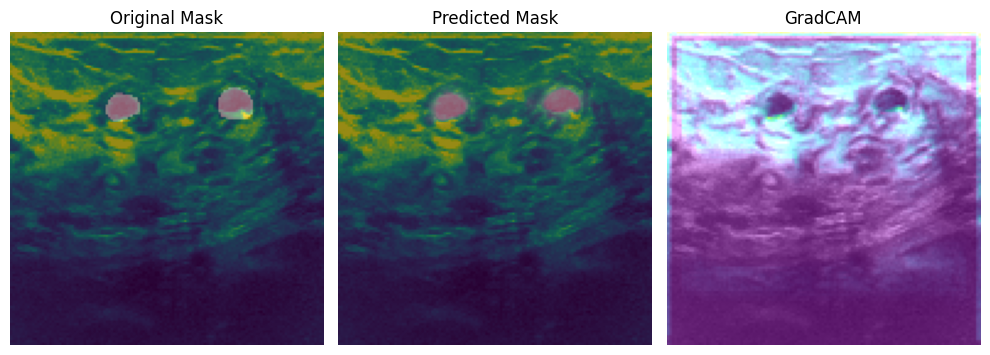

97/97 [==============================] - 9s 94ms/step - loss: 0.1126 - accuracy: 0.9581 - IoU: 0.4620 - val_loss: 0.0998 - val_accuracy: 0.9613 - val_IoU: 0.4599
Epoch 17/20
1/1 [==============================] - 0s 31ms/step


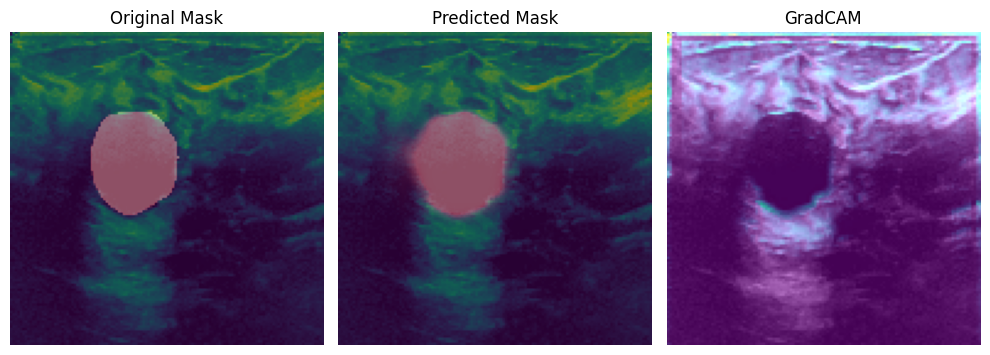

97/97 [==============================] - 8s 87ms/step - loss: 0.1041 - accuracy: 0.9624 - IoU: 0.4699 - val_loss: 0.1132 - val_accuracy: 0.9601 - val_IoU: 0.4599
Epoch 18/20
1/1 [==============================] - 0s 49ms/step


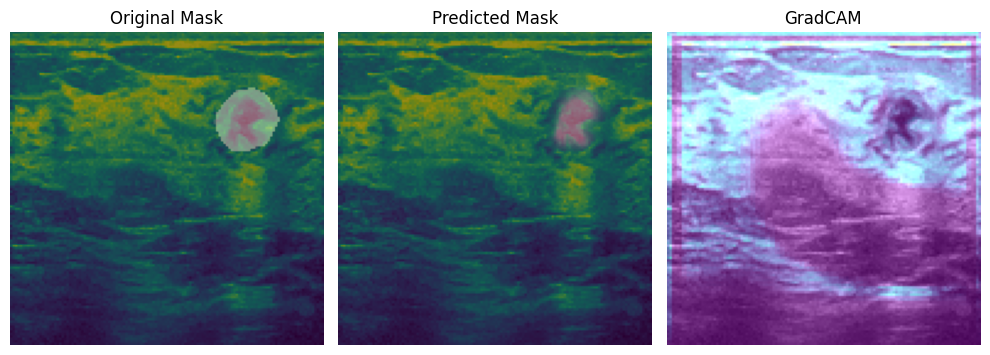

97/97 [==============================] - 9s 90ms/step - loss: 0.0947 - accuracy: 0.9642 - IoU: 0.4688 - val_loss: 0.1196 - val_accuracy: 0.9503 - val_IoU: 0.4599
Epoch 19/20
1/1 [==============================] - 0s 33ms/step


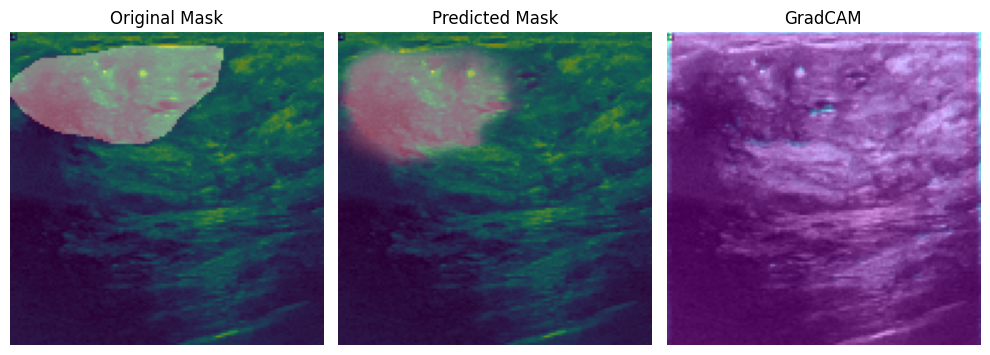

97/97 [==============================] - 9s 93ms/step - loss: 0.1008 - accuracy: 0.9614 - IoU: 0.4675 - val_loss: 0.0857 - val_accuracy: 0.9649 - val_IoU: 0.4599
Epoch 20/20
17/97 [====>.........................] - ETA: 6s - loss: 0.1276 - accuracy: 0.9509 - IoU: 0.4625

1/1 [==============================] - 0s 34ms/step


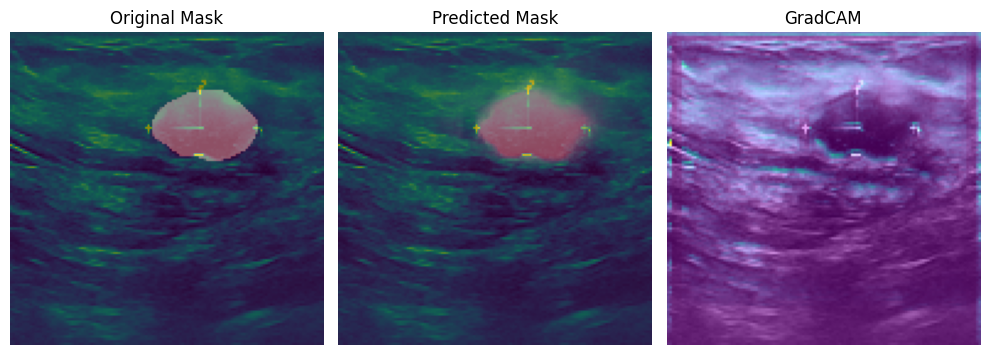

97/97 [==============================] - 2s 24ms/step - loss: 0.1276 - accuracy: 0.9509 - IoU: 0.4625 - val_loss: 0.1095 - val_accuracy: 0.9659 - val_IoU: 0.4599


In [ ]:
BATCH_SIZE = 8
SPE = len(scan)//BATCH_SIZE
history = model.fit(scan_train, mask_train, epochs = 20, batch_size = BATCH_SIZE,
                    steps_per_epoch=SPE, validation_data = (scan_test, mask_test), callbacks = cb)

In [ ]:
loss, accuracy, iou, val_loss, val_accuracy, val_iou = history.history.values()

Results

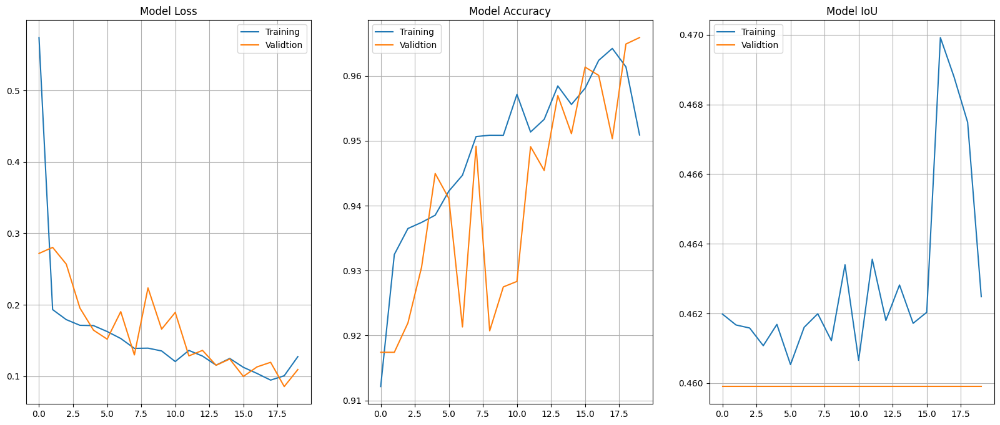

In [ ]:
plt.figure(figsize=(20,8))

plt.subplot(1,3,1)
plt.title("Model Loss")
plt.plot(loss, label="Training")
plt.plot(val_loss, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,2)
plt.title("Model Accuracy")
plt.plot(accuracy, label="Training")
plt.plot(val_accuracy, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,3)
plt.title("Model IoU")
plt.plot(iou, label="Training")
plt.plot(val_iou, label="Validtion")
plt.legend()
plt.grid()

plt.show()

Predictions

In [ ]:
mask_pred = model.predict(scan_test)

2/2 [==============================] - 5s 11ms/step


1/1 [==============================] - 0s 35ms/step


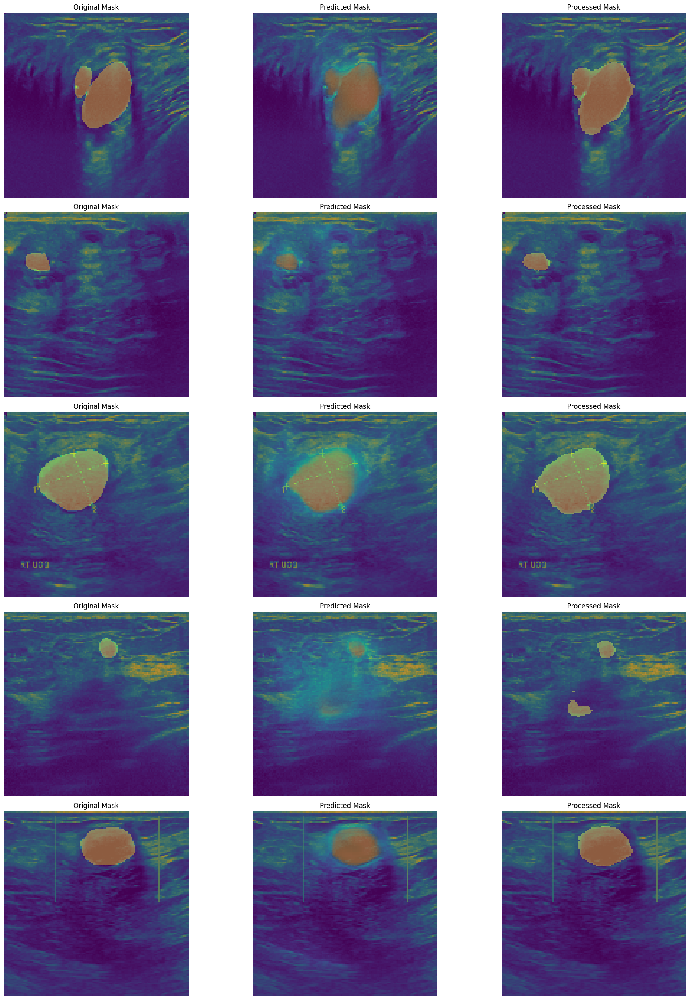

In [ ]:
plt.figure(figsize=(20,25))
n=0
for i in range(1,(5*3)+1):
    plt.subplot(5,3,i)
    if n==0:
        id = np.random.randint(len(scan))
        image = scan[id]
        m = mask[id]
        pred_mask = model.predict(image[np.newaxis,...])

        plt.title("Original Mask")
        show_mask(image, m)
        n+=1
    elif n==1:
        plt.title("Predicted Mask")
        show_mask(image, pred_mask)
        n+=1
    elif n==2:
        pred_mask = (pred_mask>0.5).astype('float')
        plt.title("Processed Mask")
        show_mask(image, pred_mask)
        n=0
plt.tight_layout()
plt.show()

# **Image Classification**

In [ ]:
os.listdir(path)

['normal', 'malignant', 'benign']

In [ ]:
info = [

    'malignant',
    'benign'
    'normal'
]

In [ ]:
info = ['normal', 'malignant', 'benign']

In [ ]:
path = '/content/Dataset_BUSI_with_GT/'

In [ ]:
path = '/content/drive/MyDrive/Dataset_BUSI_with_GT/'

In [ ]:
pro_img = []
labels = []

label_num = -1

for label_class in os.listdir(path) :

    new_path   = path + label_class
    label_num += 1

    for img in os.listdir(new_path) :
        if 'mask' not in img :

            labels.append(label_num)
            x = cv2.imread(path + label_class +'/'+img, cv2.IMREAD_GRAYSCALE)
            pro_img.append(img_to_array(Image.fromarray(cv2.resize(x, (128,128)))))

In [ ]:
pro_img = np.array(pro_img)
labels = np.array(labels)

In [ ]:
pro_img/= 255.0

In [ ]:
from keras.utils import to_categorical

In [ ]:
labels = to_categorical(labels)

In [ ]:
print(pro_img.shape)
print(labels.shape)

(780, 128, 128, 1)
(780, 3)


In [ ]:
print(pro_img.min())
print(pro_img.max())

0.0
1.0


(-0.5, 127.5, 127.5, -0.5)

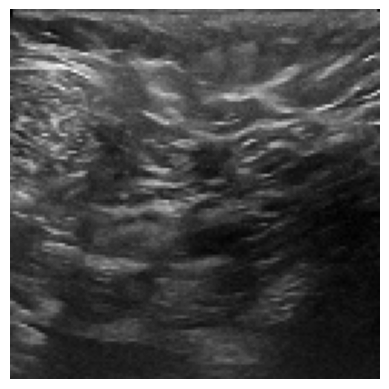

In [ ]:
plt.imshow(pro_img[0], 'gray')
plt.axis('off')

Unet model predictions

In [ ]:
from keras.models import load_model

In [ ]:
unet = load_model('./cancer_image_model_final.h5')

In [ ]:
unet_pred = unet.predict(pro_img)

25/25 [==============================] - 5s 190ms/step


0.0
5.1661444


(-0.5, 127.5, 127.5, -0.5)

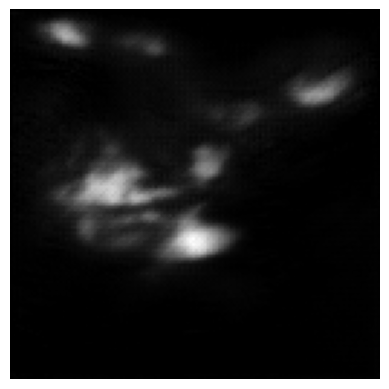

In [ ]:
print(unet_pred.min())
print(unet_pred.max())

plt.imshow(unet_pred[0], 'gray')
plt.axis('off')

Attention Unet Model Predictions

In [ ]:
att_pred = model.predict(pro_img)

25/25 [==============================] - 3s 121ms/step


0.0
1.0


(-0.5, 127.5, 127.5, -0.5)

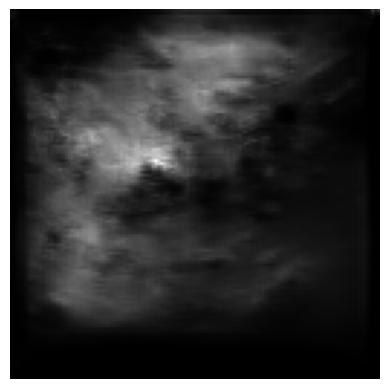

In [ ]:
print(att_pred.min())
print(att_pred.max())

plt.imshow(att_pred[0], 'gray')
plt.axis('off')

Data distribution

In [ ]:
import pandas
import seaborn

Text(0.5, 1.0, 'Distribution of classes accross the entire dataset')

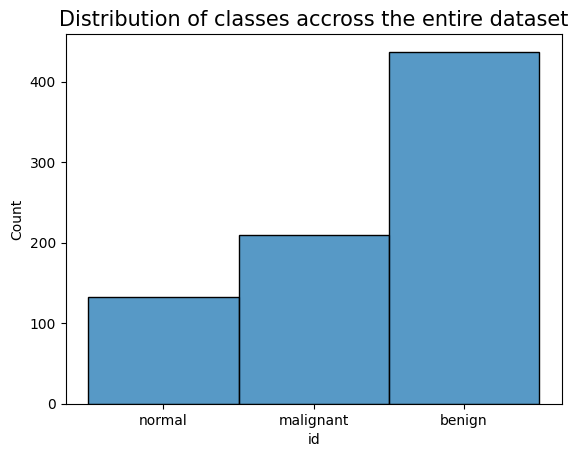

In [ ]:
seaborn.histplot(data = pandas.DataFrame({'id' : [info[p] for p in np.argmax(labels, axis = 1)]}), x = 'id')
plt.title('Distribution of classes accross the entire dataset', fontsize = 15)

**Train-Test split**

In [ ]:
pro_img_train, pro_img_test, labels_train, labels_test = train_test_split(unet_pred, labels, test_size = 0.1, shuffle = True, random_state = 1)

In [ ]:
print(pro_img_train.shape)
print(labels_train.shape)

(702, 128, 128, 1)
(702, 3)


In [ ]:
pro_img_train_att, pro_img_test_att, labels_train_att, labels_test_att = train_test_split(pred, labels, test_size = 0.1, shuffle = True, random_state = 1)

In [ ]:
print(pro_img_train_att.shape)
print(labels_train_att.shape)

(702, 128, 128, 1)
(702, 3)


In [ ]:
print(pro_img_test.shape)
print(labels_test.shape)

(78, 128, 128, 1)
(78, 3)


In [ ]:
from numpy.random import randint

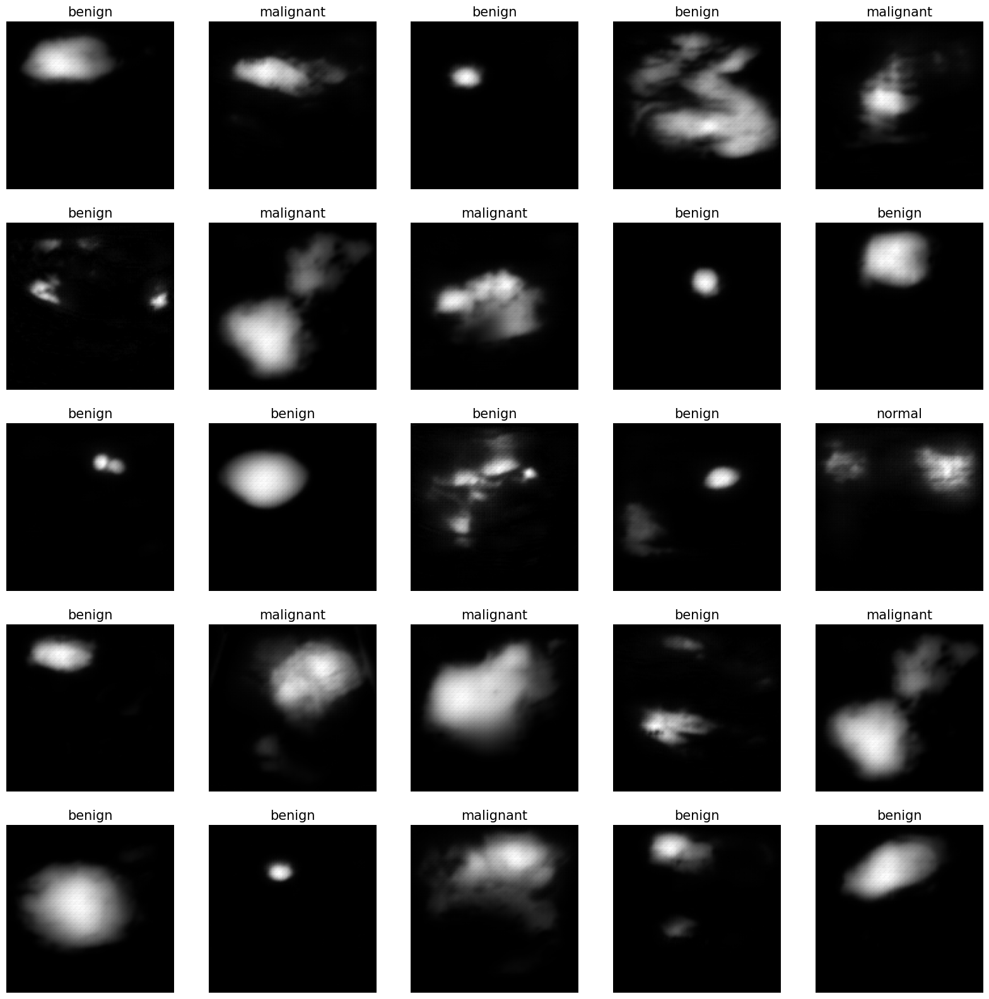

In [ ]:
plt.figure(figsize = (20,20))
i = 0
SIZE = 702
while i < 25 :

    x = randint(0, SIZE)
    plt.subplot(5,5,i+1)
    plt.imshow(unet_pred[x], 'gray')
    plt.title(f'{info[np.argmax(labels[x])]}', fontsize = 15)
    plt.axis('off')

    i += 1
plt.show()

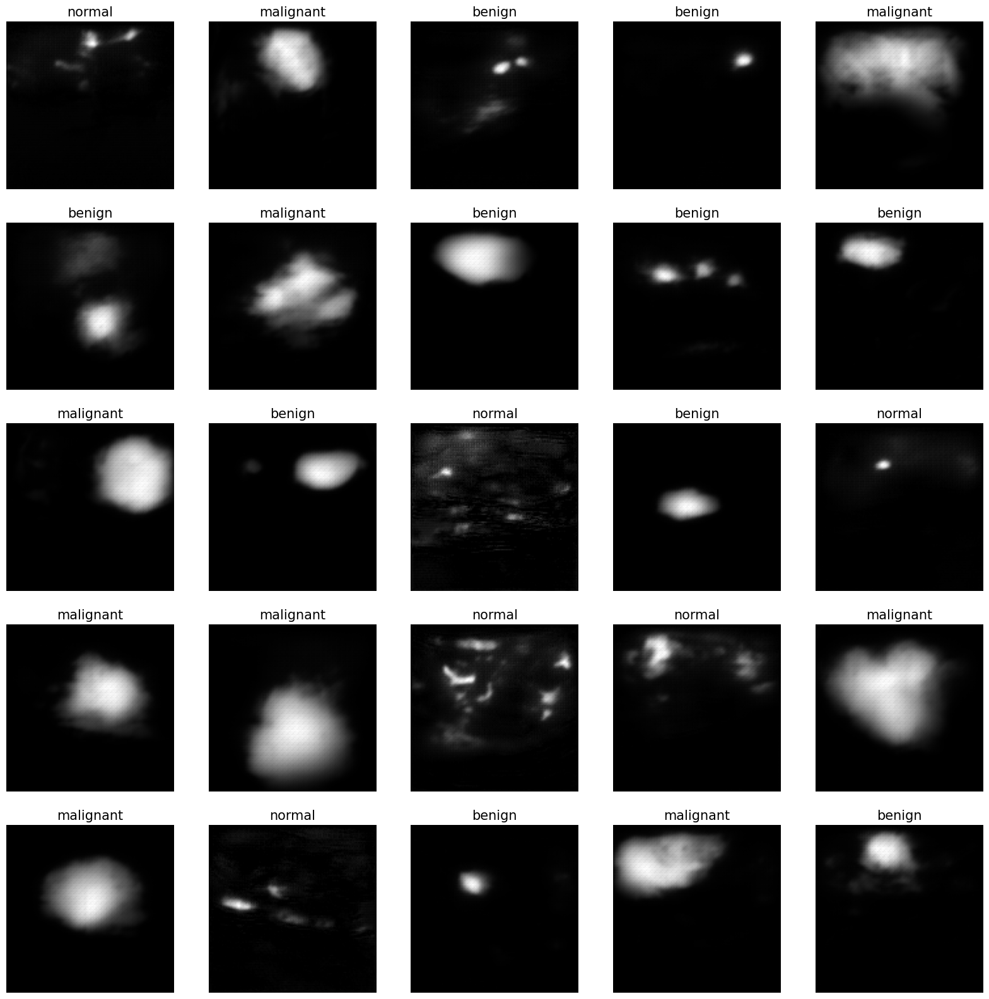

In [ ]:
plt.figure(figsize = (20,20))
i = 0
SIZE = 702
while i < 25 :

    x = randint(0, SIZE)
    plt.subplot(5,5,i+1)
    plt.imshow(pro_img_train[x], 'gray')
    plt.title(f'{info[np.argmax(labels_train[x])]}', fontsize = 15)
    plt.axis('off')

    i += 1
plt.show()

**Data Augmentation**

In [ ]:
from keras.preprocessing.image import ImageDataGenerator

In [ ]:
train_gen = ImageDataGenerator(
    horizontal_flip = True, rotation_range = 15, width_shift_range = [-10, 10],
    height_shift_range = [-10, 10], zoom_range = [0.80, 1.00])

In [ ]:
train_gen.fit(pro_img_train_att)

In [ ]:
train_gen.fit(pro_img_train)

In [ ]:
pointer = train_gen.flow(pro_img_train_att, labels_train_att)

In [ ]:
trainX, trainy = pointer.next()

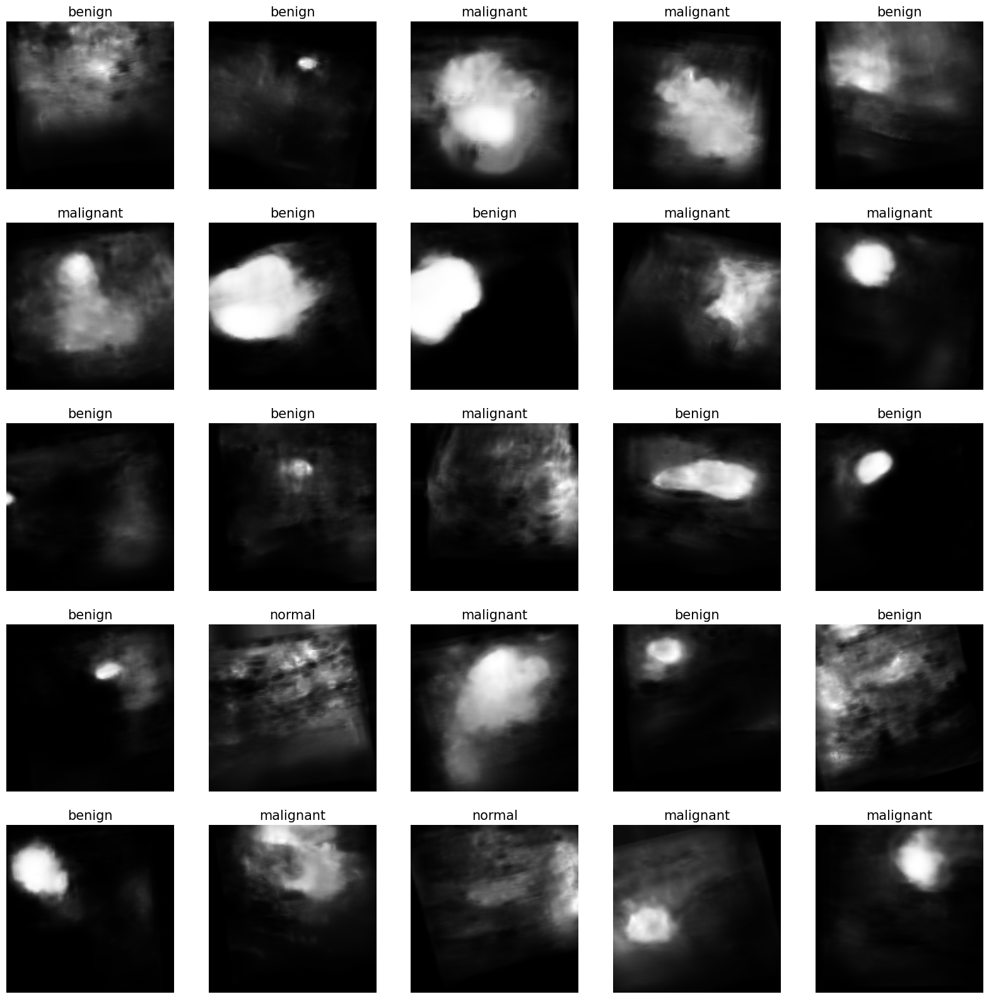

In [ ]:
plt.figure(figsize = (20,20))

i = 0

while i < 25 :

    plt.subplot(5, 5, i+1)
    plt.imshow(trainX[i], 'gray')
    plt.title(f'{info[np.argmax(trainy[i])]}', fontsize = 15)
    plt.axis('off')

    i += 1
plt.show()

make CNN model

In [ ]:
from keras.layers import BatchNormalization
from keras.models import Sequential
from keras.layers import LeakyReLU
from keras.optimizers import Adam
from keras.layers import Flatten
from keras.layers import Dense

In [ ]:
def conv_block (filterx) :

    cnn_model = Sequential()

    cnn_model.add(Conv2D(filterx, (3,3), strides = 1, padding = 'same', kernel_regularizer = 'l2'))
    cnn_model.add(BatchNormalization())
    cnn_model.add(Dropout(.2))
    cnn_model.add(LeakyReLU())

    cnn_model.add(MaxPooling2D())

    return cnn_model

def dens_block (hiddenx) :

    cnn_model = Sequential()

    cnn_model.add(Dense(hiddenx, kernel_regularizer = 'l2'))
    cnn_model.add(BatchNormalization())
    cnn_model.add(Dropout(.2))
    cnn_model.add(LeakyReLU())

    return cnn_model

In [ ]:
def conv_block (filterx) :

    cnn_model = Sequential()

    cnn_model.add(Conv2D(filterx, (3,3), strides = 1, padding = 'same', kernel_regularizer = 'l2'))
    cnn_model.add(BatchNormalization())
    cnn_model.add(Dropout(.2))
    cnn_model.add(LeakyReLU())

    cnn_model.add(MaxPooling2D())

    return cnn_model

def dens_block (hiddenx) :

    cnn_model = Sequential()

    cnn_model.add(Dense(hiddenx, kernel_regularizer = 'l2'))
    cnn_model.add(BatchNormalization())
    cnn_model.add(Dropout(.2))
    cnn_model.add(LeakyReLU())

    return cnn_model

In [ ]:
def cnn (filter1, filter2, filter3, filter4, hidden1) :

    cnn_model = Sequential([

        Input((128,128,1,)),
        conv_block(filter1),
        conv_block(filter2),
        conv_block(filter3),
        conv_block(filter4),
        Flatten(),
        dens_block(hidden1),
        Dense(3, activation = 'softmax')
    ])

    cnn_model.compile(loss = 'categorical_crossentropy', optimizer = Adam(learning_rate = 0.0005), metrics = ['accuracy'])

    return cnn_model

In [ ]:
cnn_model = cnn(32, 64, 128, 256, 32)
cnn_model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 64, 64, 32)        448       
                                                                 
 sequential_2 (Sequential)   (None, 32, 32, 64)        18752     
                                                                 
 sequential_3 (Sequential)   (None, 16, 16, 128)       74368     
                                                                 
 sequential_4 (Sequential)   (None, 8, 8, 256)         296192    
                                                                 
 flatten (Flatten)           (None, 16384)             0         
                                                                 
 sequential_5 (Sequential)   (None, 32)                524448    
                                                                 
 dense_1 (Dense)             (None, 3)                

In [ ]:
from keras.utils import plot_model


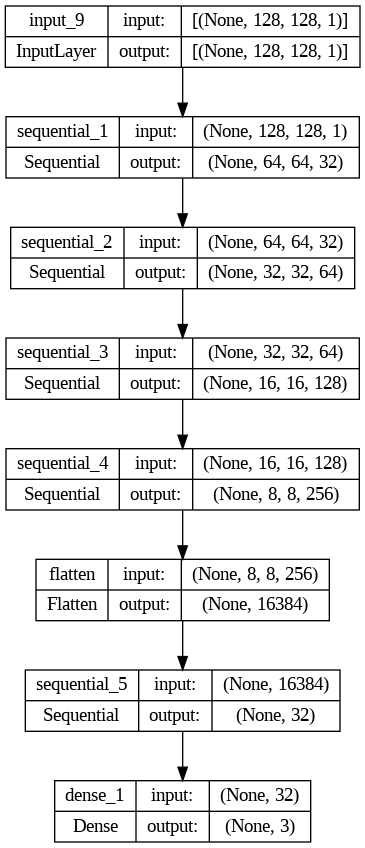

In [ ]:
plot_model(cnn_model, 'cancer_classify.png', show_shapes = True)

## **Classification for Unet Masks**

In [ ]:
checkp = ModelCheckpoint('./valid_classifier_final.h5', monitor = 'val_loss', save_best_only = True, verbose = 1)

In [ ]:
history = cnn_model.fit(train_gen.flow(pro_img_train, labels_train, batch_size = 64), epochs = 400, validation_data = (pro_img_test, labels_test), callbacks = [checkp])

Epoch 1/400
11/11 [==============================] - ETA: 0s - loss: 4.7336 - accuracy: 0.5157
Epoch 1: val_loss improved from inf to 4.70144, saving model to ./valid_classifier_final.h5
11/11 [==============================] - 9s 542ms/step - loss: 4.7336 - accuracy: 0.5157 - val_loss: 4.7014 - val_accuracy: 0.1795
Epoch 2/400
11/11 [==============================] - ETA: 0s - loss: 4.3872 - accuracy: 0.5997
Epoch 2: val_loss improved from 4.70144 to 4.55559, saving model to ./valid_classifier_final.h5
11/11 [==============================] - 1s 129ms/step - loss: 4.3872 - accuracy: 0.5997 - val_loss: 4.5556 - val_accuracy: 0.1795
Epoch 3/400
11/11 [==============================] - ETA: 0s - loss: 3.9984 - accuracy: 0.6610
Epoch 3: val_loss improved from 4.55559 to 4.36032, saving model to ./valid_classifier_final.h5
11/11 [==============================] - 1s 125ms/step - loss: 3.9984 - accuracy: 0.6610 - val_loss: 4.3603 - val_accuracy: 0.1795
Epoch 4/400
11/11 [===================

Text(0.5, 1.0, 'Loss val wrt. Epochs')

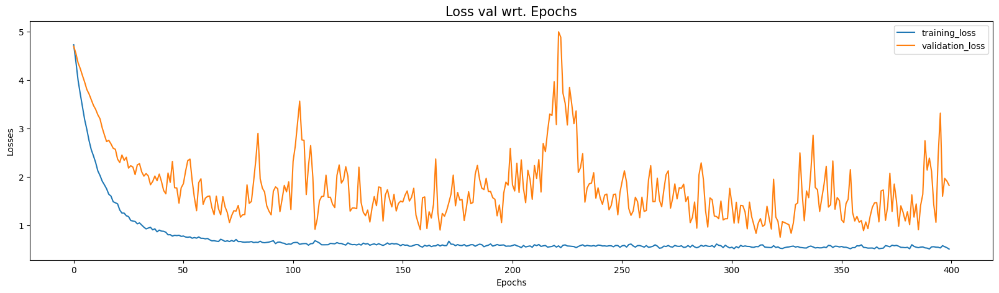

In [ ]:
plt.figure(figsize = (20,5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training_loss', 'validation_loss'])
plt.xlabel('Epochs')
plt.ylabel('Losses')
plt.title('Loss val wrt. Epochs', fontsize = 15)

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [ ]:
labels_pred = cnn_model.predict(pro_img_test)

3/3 [==============================] - 0s 10ms/step


In [ ]:
labels_pred = np.argmax(labels_pred, axis = 1)
labels_test = np.argmax(labels_test, axis = 1)

In [ ]:
print('Accuracy : ' + str(accuracy_score(labels_test, labels_pred)))
print(classification_report(labels_test, labels_pred, target_names = info))

Accuracy : 0.21794871794871795
              precision    recall  f1-score   support

      normal       0.00      0.00      0.00        14
   malignant       0.22      1.00      0.37        17
      benign       0.00      0.00      0.00        47

    accuracy                           0.22        78
   macro avg       0.07      0.33      0.12        78
weighted avg       0.05      0.22      0.08        78



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
cm = confusion_matrix(labels_test,labels_pred)

Text(0.5, 63.222222222222186, 'Predicted')

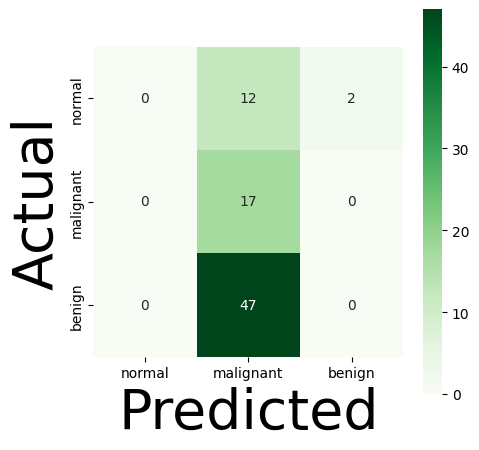

In [ ]:
plt.figure(figsize = (5,5))
ax = seaborn.heatmap(cm, cmap=plt.cm.Greens, annot=True, square=True, xticklabels = info, yticklabels = info)
ax.set_ylabel('Actual', fontsize=40)
ax.set_xlabel('Predicted', fontsize=40)

## **Classification for AttentionUnet Masks**

In [ ]:
checkp = ModelCheckpoint('./attUnet_classifier_final.h5', monitor = 'val_loss', save_best_only = True, verbose = 1)

In [ ]:
results = cnn_model.fit(train_gen.flow(pro_img_train_att, labels_train_att, batch_size = 64), epochs = 400, validation_data = (pro_img_test_att, labels_test_att), callbacks = [checkp])

Epoch 1/400
11/11 [==============================] - ETA: 0s - loss: 4.6775 - accuracy: 0.5826
Epoch 1: val_loss improved from inf to 4.82324, saving model to ./attUnet_classifier_final.h5
11/11 [==============================] - 7s 327ms/step - loss: 4.6775 - accuracy: 0.5826 - val_loss: 4.8232 - val_accuracy: 0.2051
Epoch 2/400
11/11 [==============================] - ETA: 0s - loss: 4.2484 - accuracy: 0.6581
Epoch 2: val_loss improved from 4.82324 to 4.80835, saving model to ./attUnet_classifier_final.h5
11/11 [==============================] - 2s 188ms/step - loss: 4.2484 - accuracy: 0.6581 - val_loss: 4.8084 - val_accuracy: 0.1795
Epoch 3/400
11/11 [==============================] - ETA: 0s - loss: 3.9531 - accuracy: 0.6952
Epoch 3: val_loss improved from 4.80835 to 4.68306, saving model to ./attUnet_classifier_final.h5
11/11 [==============================] - 2s 135ms/step - loss: 3.9531 - accuracy: 0.6952 - val_loss: 4.6831 - val_accuracy: 0.1795
Epoch 4/400
11/11 [=============

Text(0.5, 1.0, 'Loss val wrt. Epochs')

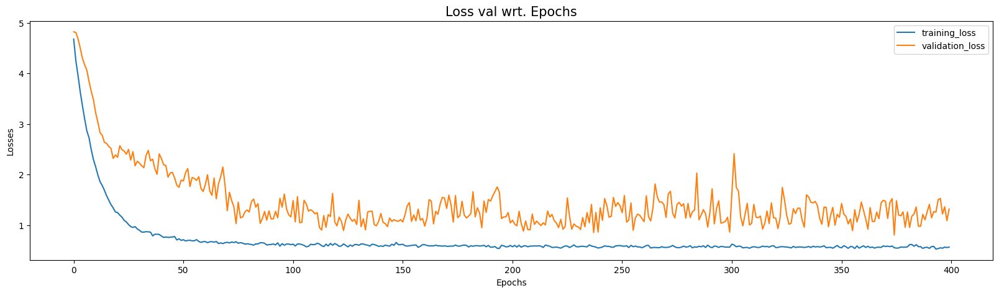

In [ ]:
plt.figure(figsize = (20,5))
plt.plot(results.history['loss'])
plt.plot(results.history['val_loss'])
plt.legend(['training_loss', 'validation_loss'])
plt.xlabel('Epochs')
plt.ylabel('Losses')
plt.title('Loss val wrt. Epochs', fontsize = 15)

In [ ]:
att_pred = cnn_model.predict(pro_img_test_att)

3/3 [==============================] - 0s 10ms/step


In [ ]:
att_pred = np.argmax(att_pred, axis = 1)
labels_test_att = np.argmax(labels_test_att, axis = 1)

In [ ]:
print('Accuracy : ' + str(accuracy_score(labels_test_att, att_pred)))
print(classification_report(labels_test_att, att_pred, target_names = info))

Accuracy : 0.5769230769230769
              precision    recall  f1-score   support

      normal       0.57      0.86      0.69        14
   malignant       0.39      0.65      0.49        17
      benign       0.76      0.47      0.58        47

    accuracy                           0.58        78
   macro avg       0.57      0.66      0.58        78
weighted avg       0.65      0.58      0.58        78



In [ ]:
cm = confusion_matrix(labels_test_att,att_pred)

Text(0.5, 63.222222222222186, 'Predicted')

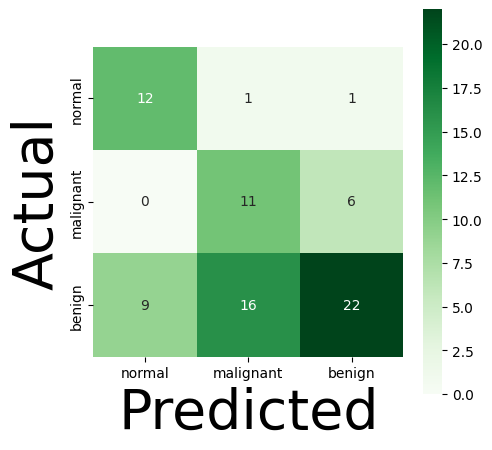

In [ ]:
plt.figure(figsize = (5,5))
ax = seaborn.heatmap(cm, cmap=plt.cm.Greens, annot=True, square=True, xticklabels = info, yticklabels = info)
ax.set_ylabel('Actual', fontsize=40)
ax.set_xlabel('Predicted', fontsize=40)

We can say from the confusion matrix of both the models that classification on Attention Unet Masks gives better results.

**Plotting Final Results**

In [ ]:
image_path = [
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/benign/benign (110).png',
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/benign/benign (100).png',
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/benign/benign (101).png',
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/benign/benign (107).png',
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/normal/normal (101).png',
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/normal/normal (111).png',
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/normal/normal (106).png',
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/malignant/malignant (115).png',
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/malignant/malignant (111).png',
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/malignant/malignant (110).png',
]

In [ ]:
testX = []
for img in image_path :
    testX.append(img_to_array(Image.fromarray(cv2.resize(cv2.imread(img, cv2.IMREAD_GRAYSCALE), (128,128)))))

In [ ]:
testX = np.array(testX)
testX/= 255.0

In [ ]:
print(testX.shape)
print(f'Minimum : {testX.min()}')
print(f'Maximum : {testX.max()}')

(10, 128, 128, 1)
Minimum : 0.0
Maximum : 1.0


(-0.5, 127.5, 127.5, -0.5)

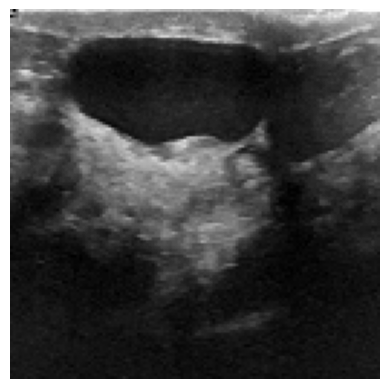

In [ ]:
plt.imshow(testX[0], 'gray')
plt.axis('off')

In [ ]:
predY = model.predict(testX)

1/1 [==============================] - 3s 3s/step


In [ ]:
print(predY.shape)

(10, 128, 128, 1)


(-0.5, 127.5, 127.5, -0.5)

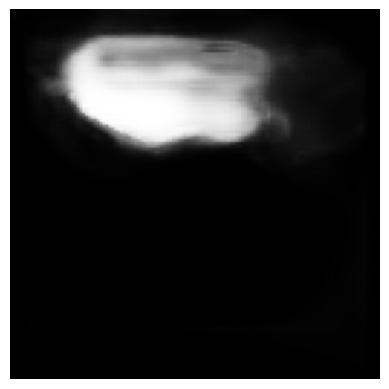

In [ ]:
plt.imshow(predY[0], 'gray')
plt.axis('off')

In [ ]:
print(predY.min())
print(predY.max())

0.0
0.99950945


In [ ]:
pred_label = cnn_model.predict(predY)

1/1 [==============================] - 0s 265ms/step


In [ ]:
pred_label.shape

(10, 3)

[2 2 2 2 0 2 0 1 1 2]


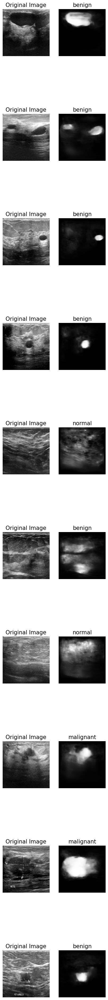

In [ ]:
print(np.argmax(pred_label, axis = 1))
plt.figure(figsize = (5,50))

i = 0
j = 0
while i < 20 :

    plt.subplot(10,2,i+1)
    plt.imshow (testX[j], 'gray')
    plt.title('Original Image', fontsize = 15)
    plt.axis('off')

    plt.subplot(10,2,i+2)
    plt.imshow (predY[j], 'gray')
    plt.title(f'{info[np.argmax(pred_label[j])]}', fontsize = 15)
    plt.axis('off')

    j += 1
    i += 2
plt.show()

In [ ]:
print(np.argmax(pred_label, axis = 1))

[2 2 2 2 0 2 0 1 1 2]
